# <center>Airline Passenger Satisfaction - ML and DL</center>

<center><img src="https://images.unsplash.com/photo-1496916308726-231181f88c06?ixlib=rb-1.2.1&ixid=MnwxMjA3fDB8MHxwaG90by1wYWdlfHx8fGVufDB8fHx8&auto=format&fit=crop&w=870&q=80"></center>

## Importing Essential Libraries and Tools

In [1]:
import numpy as np
import pandas as pd
import plotly.express as px
import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from xgboost import XGBClassifier

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense


import warnings
warnings.filterwarnings("ignore")

## Loading Data

In [2]:
df_test = pd.read_csv("../input/airline-passenger-satisfaction/test.csv")
df_train = pd.read_csv("../input/airline-passenger-satisfaction/train.csv")
df = pd.concat([df_train, df_test])

## Explatory Data Analysis

In [3]:
df.head()

,Unnamed: 0,id,Gender,Customer Type,Age,Type of Travel,Class,Flight Distance,Inflight wifi service,Departure/Arrival time convenient,...,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,Cleanliness,Departure Delay in Minutes,Arrival Delay in Minutes,satisfaction
0,0,70172,Male,Loyal Customer,13,Personal Travel,Eco Plus,460,3,4,...,5,4,3,4,4,5,5,25,18.0,neutral or dissatisfied
1,1,5047,Male,disloyal Customer,25,Business travel,Business,235,3,2,...,1,1,5,3,1,4,1,1,6.0,neutral or dissatisfied
2,2,110028,Female,Loyal Customer,26,Business travel,Business,1142,2,2,...,5,4,3,4,4,4,5,0,0.0,satisfied
3,3,24026,Female,Loyal Customer,25,Business travel,Business,562,2,5,...,2,2,5,3,1,4,2,11,9.0,neutral or dissatisfied
4,4,119299,Male,Loyal Customer,61,Business travel,Business,214,3,3,...,3,3,4,4,3,3,3,0,0.0,satisfied


In [4]:
df.shape

(129880, 25)

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 129880 entries, 0 to 25975
Data columns (total 25 columns):
 #   Column                             Non-Null Count   Dtype  
---  ------                             --------------   -----  
 0   Unnamed: 0                         129880 non-null  int64  
 1   id                                 129880 non-null  int64  
 2   Gender                             129880 non-null  object 
 3   Customer Type                      129880 non-null  object 
 4   Age                                129880 non-null  int64  
 5   Type of Travel                     129880 non-null  object 
 6   Class                              129880 non-null  object 
 7   Flight Distance                    129880 non-null  int64  
 8   Inflight wifi service              129880 non-null  int64  
 9   Departure/Arrival time convenient  129880 non-null  int64  
 10  Ease of Online booking             129880 non-null  int64  
 11  Gate location                      12988

In [6]:
df.describe()

,Unnamed: 0,id,Age,Flight Distance,Inflight wifi service,Departure/Arrival time convenient,Ease of Online booking,Gate location,Food and drink,Online boarding,Seat comfort,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,Cleanliness,Departure Delay in Minutes,Arrival Delay in Minutes
count,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129487.000000
mean,44158.700000,64940.500000,39.427957,1190.316392,2.728696,3.057599,2.756876,2.976925,3.204774,3.252633,3.441361,3.358077,3.383023,3.350878,3.632114,3.306267,3.642193,3.286326,14.713713,15.091129
std,31207.377062,37493.270818,15.119360,997.452477,1.329340,1.526741,1.401740,1.278520,1.329933,1.350719,1.319289,1.334049,1.287099,1.316252,1.180025,1.266185,1.176669,1.313682,38.071126,38.465650
min,0.000000,1.000000,7.000000,31.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,16234.750000,32470.750000,27.000000,414.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,3.000000,3.000000,3.000000,2.000000,0.000000,0.000000
50%,38963.500000,64940.500000,40.000000,844.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,4.000000,4.000000,4.000000,4.000000,4.000000,3.000000,4.000000,3.000000,0.000000,0.000000
75%,71433.250000,97410.250000,51.000000,1744.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,5.000000,4.000000,4.000000,4.000000,5.000000,4.000000,5.000000,4.000000,12.000000,13.000000
max,103903.000000,129880.000000,85.000000,4983.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,1592.000000,1584.000000


In [7]:
df.duplicated().sum()

0

In [8]:
df.isna().sum()

Unnamed: 0                             0
id                                     0
Gender                                 0
Customer Type                          0
Age                                    0
Type of Travel                         0
Class                                  0
Flight Distance                        0
Inflight wifi service                  0
Departure/Arrival time convenient      0
Ease of Online booking                 0
Gate location                          0
Food and drink                         0
Online boarding                        0
Seat comfort                           0
Inflight entertainment                 0
On-board service                       0
Leg room service                       0
Baggage handling                       0
Checkin service                        0
Inflight service                       0
Cleanliness                            0
Departure Delay in Minutes             0
Arrival Delay in Minutes             393
satisfaction    

In [9]:
df.dropna(axis=0, inplace=True)

In [10]:
df.isna().sum()

Unnamed: 0                           0
id                                   0
Gender                               0
Customer Type                        0
Age                                  0
Type of Travel                       0
Class                                0
Flight Distance                      0
Inflight wifi service                0
Departure/Arrival time convenient    0
Ease of Online booking               0
Gate location                        0
Food and drink                       0
Online boarding                      0
Seat comfort                         0
Inflight entertainment               0
On-board service                     0
Leg room service                     0
Baggage handling                     0
Checkin service                      0
Inflight service                     0
Cleanliness                          0
Departure Delay in Minutes           0
Arrival Delay in Minutes             0
satisfaction                         0
dtype: int64

In [11]:
fig = px.pie(df,names="Class", color_discrete_sequence=px.colors.sequential.RdBu)
fig.show()

In [12]:
fig = px.pie(df,names="Gender", color_discrete_sequence=px.colors.sequential.RdBu)
fig.show()

In [13]:
fig = px.pie(df,names="Customer Type", color_discrete_sequence=px.colors.sequential.RdBu)
fig.show()

In [14]:
fig = px.pie(df, names="Type of Travel", color_discrete_sequence=px.colors.sequential.RdBu)
fig.show()

In [15]:
fig = px.pie(df, names="satisfaction", color_discrete_sequence=px.colors.sequential.RdBu)
fig.show()

<AxesSubplot:xlabel='Age'>

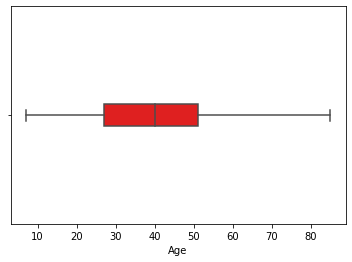

In [16]:
sns.boxplot(x=df["Age"],width=.10, color="r")

<AxesSubplot:xlabel='Flight Distance'>

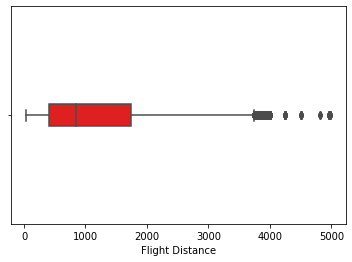

In [17]:
sns.boxplot(x=df["Flight Distance"],width=.10, color="r")

## Data Preprocessing

In [18]:
df.columns

Index(['Unnamed: 0', 'id', 'Gender', 'Customer Type', 'Age', 'Type of Travel',
       'Class', 'Flight Distance', 'Inflight wifi service',
       'Departure/Arrival time convenient', 'Ease of Online booking',
       'Gate location', 'Food and drink', 'Online boarding', 'Seat comfort',
       'Inflight entertainment', 'On-board service', 'Leg room service',
       'Baggage handling', 'Checkin service', 'Inflight service',
       'Cleanliness', 'Departure Delay in Minutes', 'Arrival Delay in Minutes',
       'satisfaction'],
      dtype='object')

In [19]:
df.head()

,Unnamed: 0,id,Gender,Customer Type,Age,Type of Travel,Class,Flight Distance,Inflight wifi service,Departure/Arrival time convenient,...,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,Cleanliness,Departure Delay in Minutes,Arrival Delay in Minutes,satisfaction
0,0,70172,Male,Loyal Customer,13,Personal Travel,Eco Plus,460,3,4,...,5,4,3,4,4,5,5,25,18.0,neutral or dissatisfied
1,1,5047,Male,disloyal Customer,25,Business travel,Business,235,3,2,...,1,1,5,3,1,4,1,1,6.0,neutral or dissatisfied
2,2,110028,Female,Loyal Customer,26,Business travel,Business,1142,2,2,...,5,4,3,4,4,4,5,0,0.0,satisfied
3,3,24026,Female,Loyal Customer,25,Business travel,Business,562,2,5,...,2,2,5,3,1,4,2,11,9.0,neutral or dissatisfied
4,4,119299,Male,Loyal Customer,61,Business travel,Business,214,3,3,...,3,3,4,4,3,3,3,0,0.0,satisfied


In [20]:
df.drop(["Unnamed: 0","id"],inplace=True,axis=1)

### Encoding

In [21]:
le = LabelEncoder()
df["Gender"] = le.fit_transform(df["Gender"])
df["Customer Type"] = le.fit_transform(df["Customer Type"])
df["Type of Travel"] = le.fit_transform(df["Type of Travel"])
df["satisfaction"] = le.fit_transform(df["satisfaction"])

In [22]:
df.head()

,Gender,Customer Type,Age,Type of Travel,Class,Flight Distance,Inflight wifi service,Departure/Arrival time convenient,Ease of Online booking,Gate location,...,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,Cleanliness,Departure Delay in Minutes,Arrival Delay in Minutes,satisfaction
0,1,0,13,1,Eco Plus,460,3,4,3,1,...,5,4,3,4,4,5,5,25,18.0,0
1,1,1,25,0,Business,235,3,2,3,3,...,1,1,5,3,1,4,1,1,6.0,0
2,0,0,26,0,Business,1142,2,2,2,2,...,5,4,3,4,4,4,5,0,0.0,1
3,0,0,25,0,Business,562,2,5,5,5,...,2,2,5,3,1,4,2,11,9.0,0
4,1,0,61,0,Business,214,3,3,3,3,...,3,3,4,4,3,3,3,0,0.0,1


In [23]:
df["Class"] = df["Class"].replace({"Eco":1,"Eco Plus":2,"Business":3})

## X and y Split

In [24]:
X = df.drop("satisfaction", axis=1)
y= df["satisfaction"]

## Train, Test and Validation Split

In [25]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

## Scaling

In [26]:
scaler = StandardScaler()

In [27]:
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

## Building Model

### Dataframe for Models Accuracy Score

In [28]:
models = pd.DataFrame(columns=["Model Name","Accuracy Score"])

### Machine Learning Models

In [29]:
model_list = [("Random Forest Classifier",RandomForestClassifier(random_state=42)),
             ("Support Vector Machines",SVC(random_state=42)),
             ("Logistic Regression",LogisticRegression(random_state=42)),
             ("Decision Tree Classifier", DecisionTreeClassifier(random_state=42)),
             ("KNeighbors Classifier",KNeighborsClassifier(n_neighbors=2)),
             ("XGBoost Classifier", XGBClassifier(random_state=42)),
             ("Gaussian Naive Bayes", GaussianNB())]

In [30]:
for name,clf in model_list:
    clf.fit(X_train, y_train)
    predictions = clf.predict(X_test)
    score = accuracy_score(y_test, predictions)
    
    new_row = {"Model Name":name, "Accuracy Score":score}
    models = models.append(new_row, ignore_index=True)

In [31]:
models.sort_values(by="Accuracy Score", ascending=False)

,Model Name,Accuracy Score
5,XGBoost Classifier,0.963807
0,Random Forest Classifier,0.961928
1,Support Vector Machines,0.953484
3,Decision Tree Classifier,0.945478
4,KNeighbors Classifier,0.913893
2,Logistic Regression,0.872603
6,Gaussian Naive Bayes,0.864108


### Deep Learning

In [32]:
X_test, X_val, y_test, y_val = train_test_split(X_test, y_test, test_size=0.5, random_state=42)

In [33]:
model = Sequential()

model.add(Dense(16, activation="relu"))
model.add(Dense(32, activation="relu"))
model.add(Dense(16, activation="relu"))

model.add(Dense(1, activation="sigmoid"))

model.compile(optimizer="Adam", loss="binary_crossentropy", metrics=["accuracy"])

2022-09-15 15:14:44.923694: I tensorflow/core/common_runtime/process_util.cc:146] Creating new thread pool with default inter op setting: 2. Tune using inter_op_parallelism_threads for best performance.


In [34]:
model.fit(X_train, y_train, validation_data=(X_val, y_val), batch_size=256, epochs=100)

2022-09-15 15:14:45.600107: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:185] None of the MLIR Optimization Passes are enabled (registered 2)


Epoch 1/100
355/355 [==============================] - 2s 4ms/step - loss: 0.3334 - accuracy: 0.8624 - val_loss: 0.2345 - val_accuracy: 0.9064
Epoch 2/100
355/355 [==============================] - 1s 3ms/step - loss: 0.1991 - accuracy: 0.9201 - val_loss: 0.1831 - val_accuracy: 0.9259
Epoch 3/100
355/355 [==============================] - 2s 5ms/step - loss: 0.1677 - accuracy: 0.9328 - val_loss: 0.1638 - val_accuracy: 0.9332
Epoch 4/100
355/355 [==============================] - 1s 3ms/step - loss: 0.1515 - accuracy: 0.9386 - val_loss: 0.1515 - val_accuracy: 0.9383
Epoch 5/100
355/355 [==============================] - 1s 3ms/step - loss: 0.1406 - accuracy: 0.9431 - val_loss: 0.1414 - val_accuracy: 0.9422
Epoch 6/100
355/355 [==============================] - 1s 3ms/step - loss: 0.1323 - accuracy: 0.9463 - val_loss: 0.1365 - val_accuracy: 0.9447
Epoch 7/100
355/355 [==============================] - 1s 3ms/step - loss: 0.1261 - accuracy: 0.9485 - val_loss: 0.1284 - val_accuracy: 0.9484

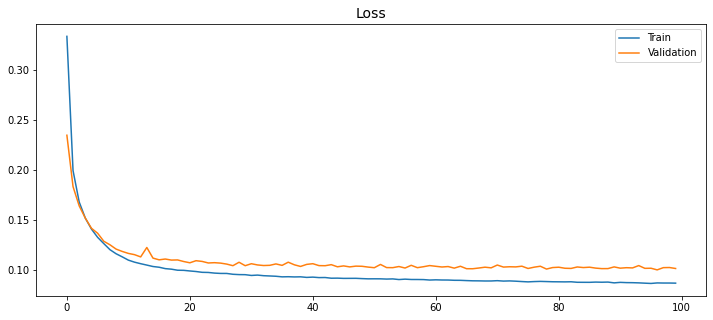

In [35]:
history = pd.DataFrame(model.history.history)

plt.figure(figsize=(12, 5))
history["loss"].plot(label="Train")
history["val_loss"].plot(label="Validation")
plt.legend()
plt.title("Loss", size=14)
plt.show()

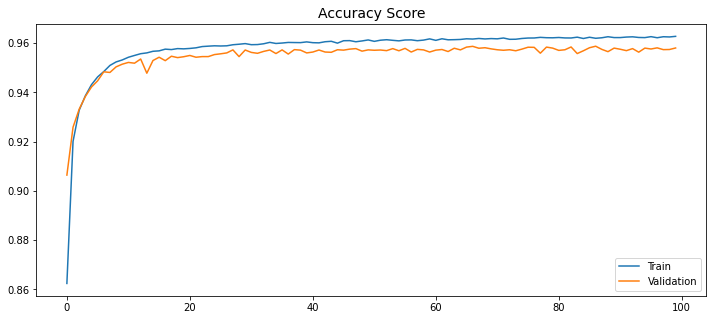

In [36]:
plt.figure(figsize=(12, 5))
history["accuracy"].plot(label="Train")
history["val_accuracy"].plot(label="Validation")
plt.legend()
plt.title("Accuracy Score", size=14)
plt.show()

In [37]:
model.evaluate(X_test, y_test)

607/607 [==============================] - 1s 1ms/step - loss: 0.0971 - accuracy: 0.9602


[0.0970863401889801, 0.9602017998695374]

## Conclusion

After analyzing the data and building ML and DL models, I have come to the conclusion that the classifier that gives the best score is **XGBoost** classifier with an accuracy score of **0.963807**.